In [1]:
using Pkg
Pkg.instantiate()

In [2]:
using Revise, CairoMakie
using ColonyImages
using DataFrames, CSV, FileIO, Dates
import ColorSchemes as co 

# 1.Create Eden Model schematic

### 1.1 Set Parameters

In [3]:
para = parameters(im_size= [800,800], time_points =[0,36.0,72, 108]);

### 1.2 Create spherical  starting colony 

In [4]:
colony  =BitArray(zeros(Bool, para.im_size...,para.stacks))
build_artifical_colony!(para.Center,(@view colony[:,:,1]),para.radius_colony,para.Points)
pixel_to_add_vec = para.pixel_to_add(colony[:,:,1])

3-element Vector{Int64}:
  9814
 28165
 80825

### 1.3 Randomly expand spherical starting colony 

In [5]:
for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_radom_cov!(int_img,pixel_to_add_vec[j-1])
end

### 1.3.1  Make Plot

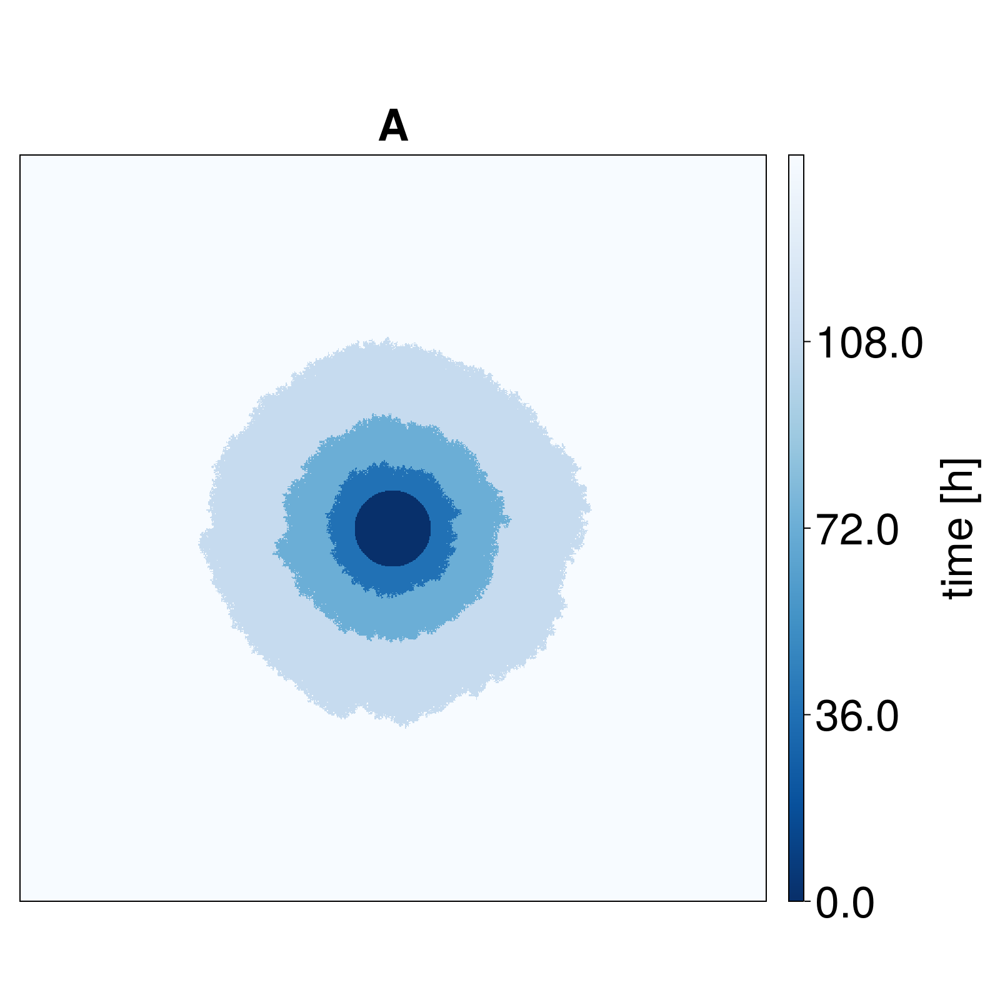

In [6]:
fontsize_theme = Theme(fontsize = 35)
update_theme!(fontsize_theme)
plot_timeseries_heatmap(colony,para, name = "A")

### 1.4 Finger like expansion 

In [7]:
dir_vec = generate_dir_vec(para)
for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_finger_radom_cov!(int_img,pixel_to_add_vec[j-1],dir_vec)
end


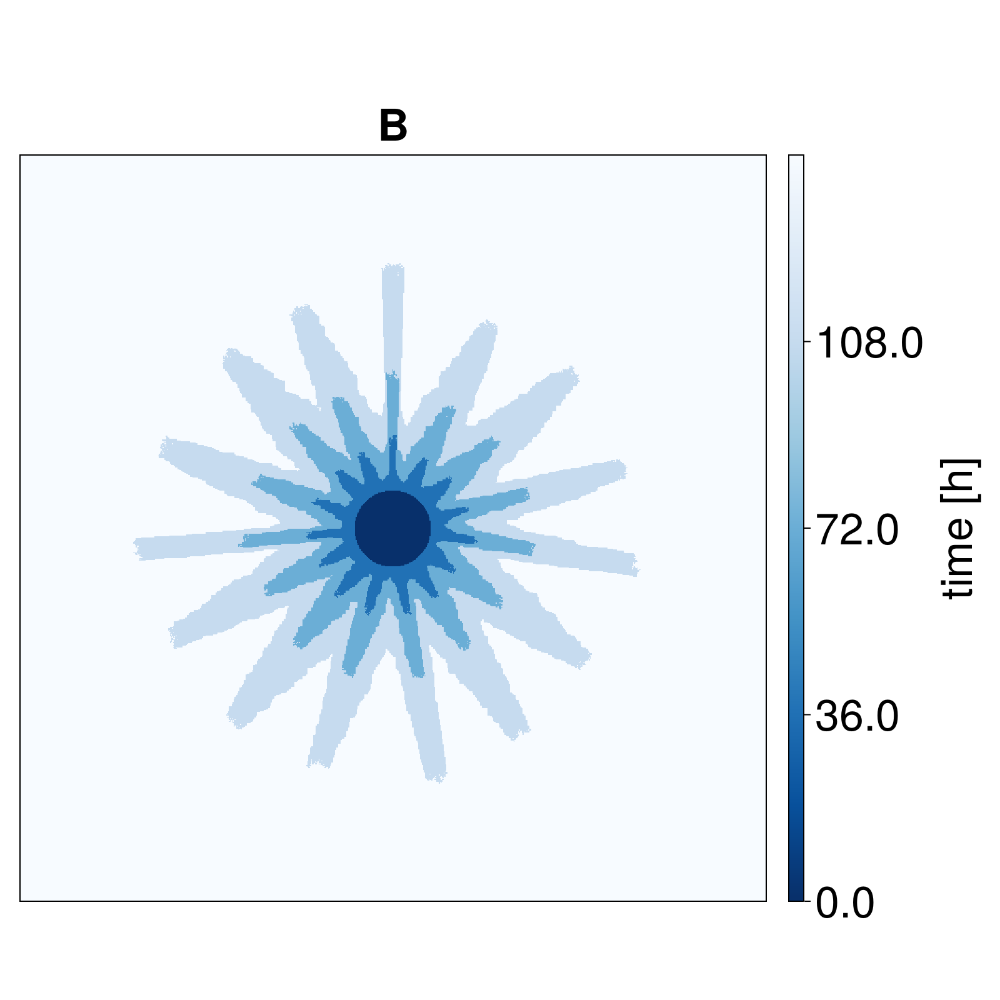

In [8]:
plot_timeseries_heatmap(colony,para, name = "B")

In [9]:
dir_vec = generate_dir_vec(para)
for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_finger_radom_cov!(int_img,pixel_to_add_vec[j-1],dir_vec, still_spawn_rate= 0.0,dir_match_rate= 0.998)
end


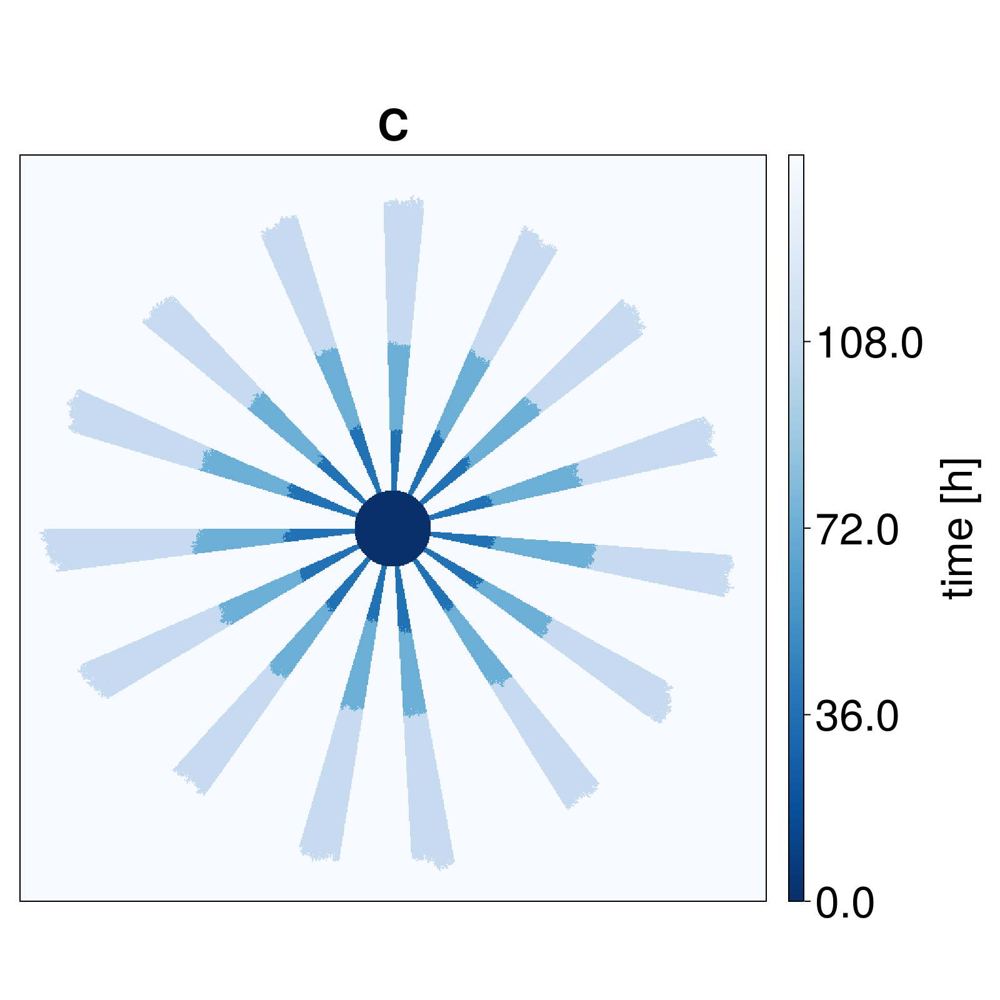

In [10]:
plot_timeseries_heatmap(colony,para, name = "C")

# 2. Make convolution Schematic

### 2.1 Create empty colony

In [11]:
para = parameters(
    time_points = Float64[0,24,48,72,96,120],
    im_size = [10,10],   
)

parameters
  time_points: Array{Float64}((6,)) [0.0, 24.0, 48.0, 72.0, 96.0, 120.0]
  threshold_conv: Float64 0.8
  threshold_c: Float64 0.8
  kernel_ratio: Float64 0.4
  steps_angular: Int64 360
  samples_pair: Int64 2000000
  timesteps: Int64 300
  im_size: Array{Int64}((2,)) [10, 10]
  stacks: Int64 6
  radius_colony: Int64 0
  Center: Array{Int64}((2,)) [5, 5]
  growth_rate: Float64 0.02971700864000873
  colony_size: #5 (function of type ColonyImages.var"#5#13"{Float64})
  relative_size_filles_holes: Float64 0.01
  laplac_kernel: Array{Int64}((3, 3)) [0 1 0; 1 -4 1; 0 1 0]
  colony_nr: Int64 4
  colonies: Array{String}((4,))
  plot_factor: Float64 2.0
  Points: Array{Vector{Vector{Int64}}}((3,))
  col_size_add: Array{Float64}((6,)) [0.0, 1.0194321829554176, 3.078106341556083, 7.2354591916529305, 15.630951333039935, 32.58507835510615]
  col_size_add_diff: Array{Float64}((5,)) [1.0194321829554176, 2.0586741586006654, 4.1573528500968475, 8.395492141387004, 16.954127022066213]
  number

In [12]:
colony  =BitArray(zeros(Bool, para.im_size...,para.stacks))
colony_cov =zeros(Float64, para.im_size...,para.stacks)
build_artifical_colony!(para.Center,(@view colony[:,:,1]),para.radius_colony,para.Points)
pixel_to_add_vec = para.pixel_to_add(colony[:,:,1])

5-element Vector{Int64}:
  1
  2
  4
  8
 17

In [13]:
begin 
    @label loop_try_as_long_until_it_works
    try 
        for j in 2:para.stacks
            # use view to work on array directly 
            int_img  = @view colony[:,:,j]
            #assign previous colony to current colony
            int_img[:] = colony[:,:,j-1]
            colony_cov[:,:,j] = expand_colony_radom_cov_show!(int_img,pixel_to_add_vec[j-1])
        end
    catch
        print("failed ")
        @goto loop_try_as_long_until_it_works
    end   
end

failed failed failed failed failed failed failed failed failed 

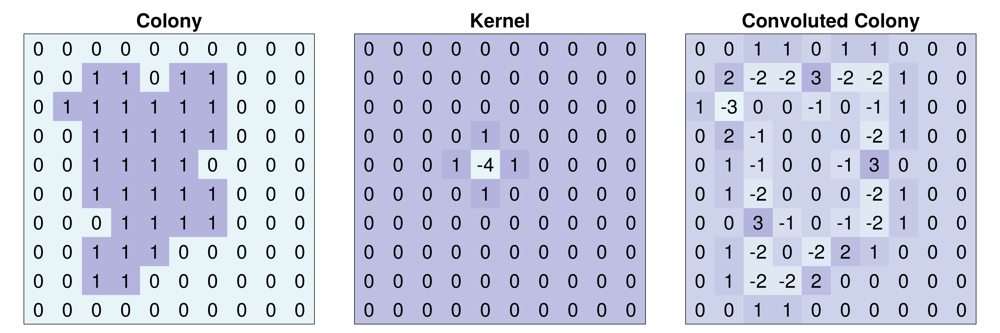

In [14]:
plot_convolution_schematic3(colony, colony_cov, para)

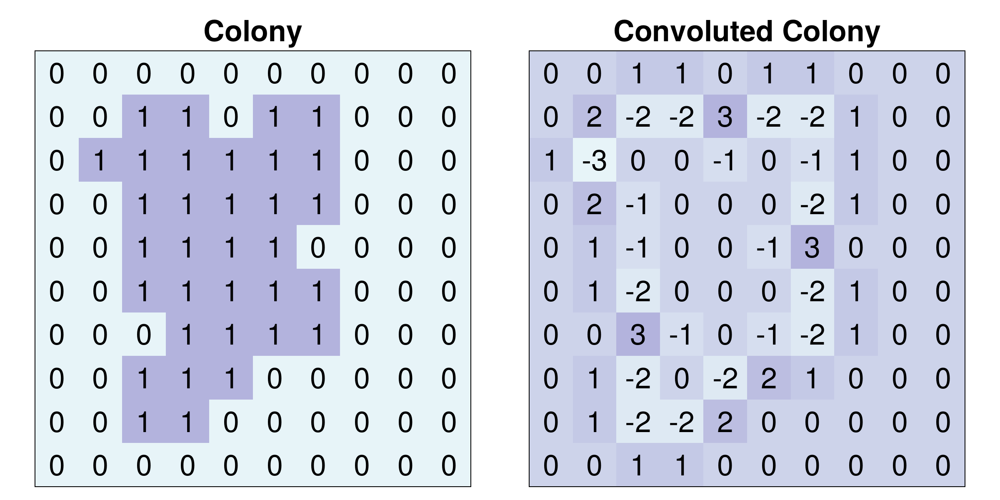

In [15]:
plot_convolution_schematic2(colony, colony_cov, para, name = "cov_fig1")

In [16]:
border_points = (findall(colony_cov[:,:,end] .> 0.1))
for i in 1:length(border_points)
    println(i, " ", border_points[i])
end

1 CartesianIndex(3, 1)
2 CartesianIndex(4, 1)
3 CartesianIndex(2, 2)
4 CartesianIndex(5, 2)
5 CartesianIndex(2, 3)
6 CartesianIndex(6, 3)
7 CartesianIndex(7, 3)
8 CartesianIndex(3, 4)
9 CartesianIndex(8, 4)
10 CartesianIndex(2, 5)
11 CartesianIndex(8, 5)
12 CartesianIndex(2, 6)
13 CartesianIndex(7, 6)
14 CartesianIndex(2, 7)
15 CartesianIndex(8, 7)
16 CartesianIndex(1, 8)
17 CartesianIndex(8, 8)
18 CartesianIndex(2, 9)
19 CartesianIndex(5, 9)
20 CartesianIndex(8, 9)
21 CartesianIndex(3, 10)
22 CartesianIndex(4, 10)
23 CartesianIndex(6, 10)
24 CartesianIndex(7, 10)


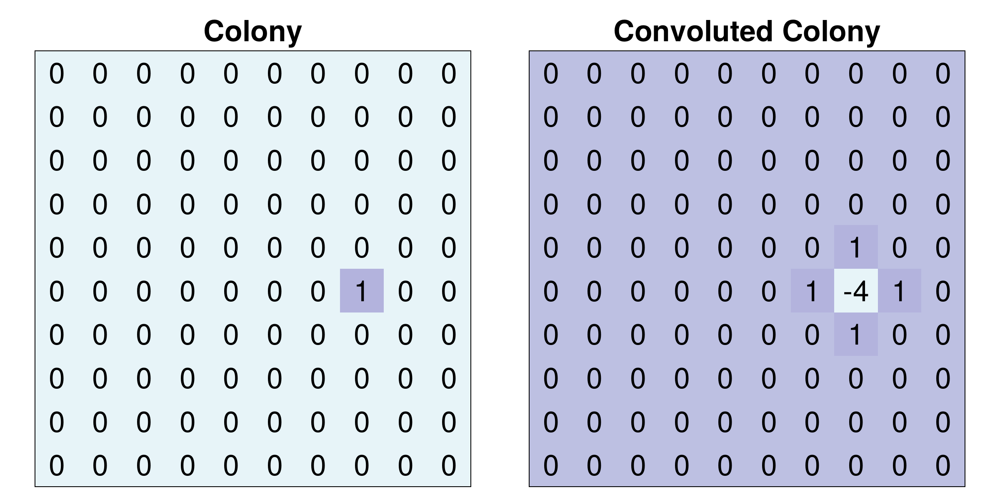

In [17]:
point = border_points[11]
expand_colony_point!(colony[:,:,end], colony_cov[:,:,end], point);

cov_add = zeros(Int, para.im_size...)
data_add = zeros(Int, para.im_size...)

cov_add[point[1]-1:point[1]+1,point[2]-1:point[2]+1] += para.laplac_kernel
data_add[point] += 1

plot_convolution_schematic2(data_add, cov_add, para, name ="added_point")

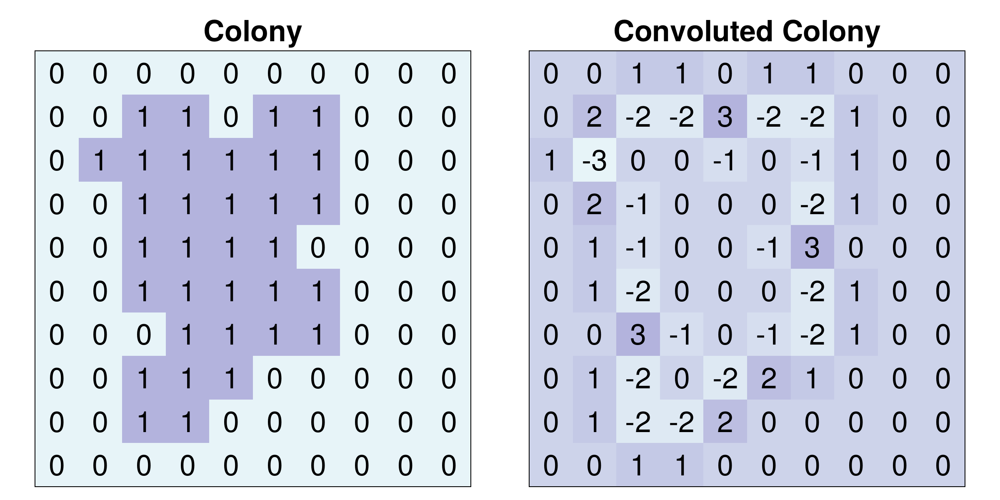

In [18]:
plot_convolution_schematic2(colony, colony_cov, para, name ="cov_fig2")

# 3. Show all colonies

In [19]:
para = parameters(
    time_points = Float64[0,24,48,72,96,120],
    im_size = [1000,1000],
    plot_factor = 2
)

parameters
  time_points: Array{Float64}((6,)) [0.0, 24.0, 48.0, 72.0, 96.0, 120.0]
  threshold_conv: Float64 0.8
  threshold_c: Float64 0.8
  kernel_ratio: Float64 0.4
  steps_angular: Int64 360
  samples_pair: Int64 2000000
  timesteps: Int64 300
  im_size: Array{Int64}((2,)) [1000, 1000]
  stacks: Int64 6
  radius_colony: Int64 50
  Center: Array{Int64}((2,)) [500, 500]
  growth_rate: Float64 0.02971700864000873
  colony_size: #5 (function of type ColonyImages.var"#5#13"{Float64})
  relative_size_filles_holes: Float64 0.01
  laplac_kernel: Array{Int64}((3, 3)) [0 1 0; 1 -4 1; 0 1 0]
  colony_nr: Int64 4
  colonies: Array{String}((4,))
  plot_factor: Float64 2.0
  Points: Array{Vector{Vector{Int64}}}((498,))
  col_size_add: Array{Float64}((6,)) [0.0, 1.0194321829554176, 3.078106341556083, 7.2354591916529305, 15.630951333039935, 32.58507835510615]
  col_size_add_diff: Array{Float64}((5,)) [1.0194321829554176, 2.0586741586006654, 4.1573528500968475, 8.395492141387004, 16.95412702206621

In [20]:
img_int_vec_2 = Vector{BitArray{3}}(undef, 0)
for i in 1:para.colony_nr
    hans =BitArray(zeros(Bool, para.im_size...,para.stacks))
    push!(img_int_vec_2, hans)
end

In [23]:
for (i,colony) in enumerate(img_int_vec_2)
    for (j,t) in enumerate(para.time_points)
        # use view to work on array directly 
        int_img  = @view colony[:,:,j]
        if j == 1
            build_artifical_colony!(para.Center,int_img,para.radius_colony,para.Points)
            pixel_to_add_vec = para.pixel_to_add(int_img)
        else
            # for unkown reason views require [:] to make assignments 
            int_img[:] = colony[:,:,j-1]
            expand_colony_radom_cov!(int_img,pixel_to_add_vec[j-1])
        end
    end   
end

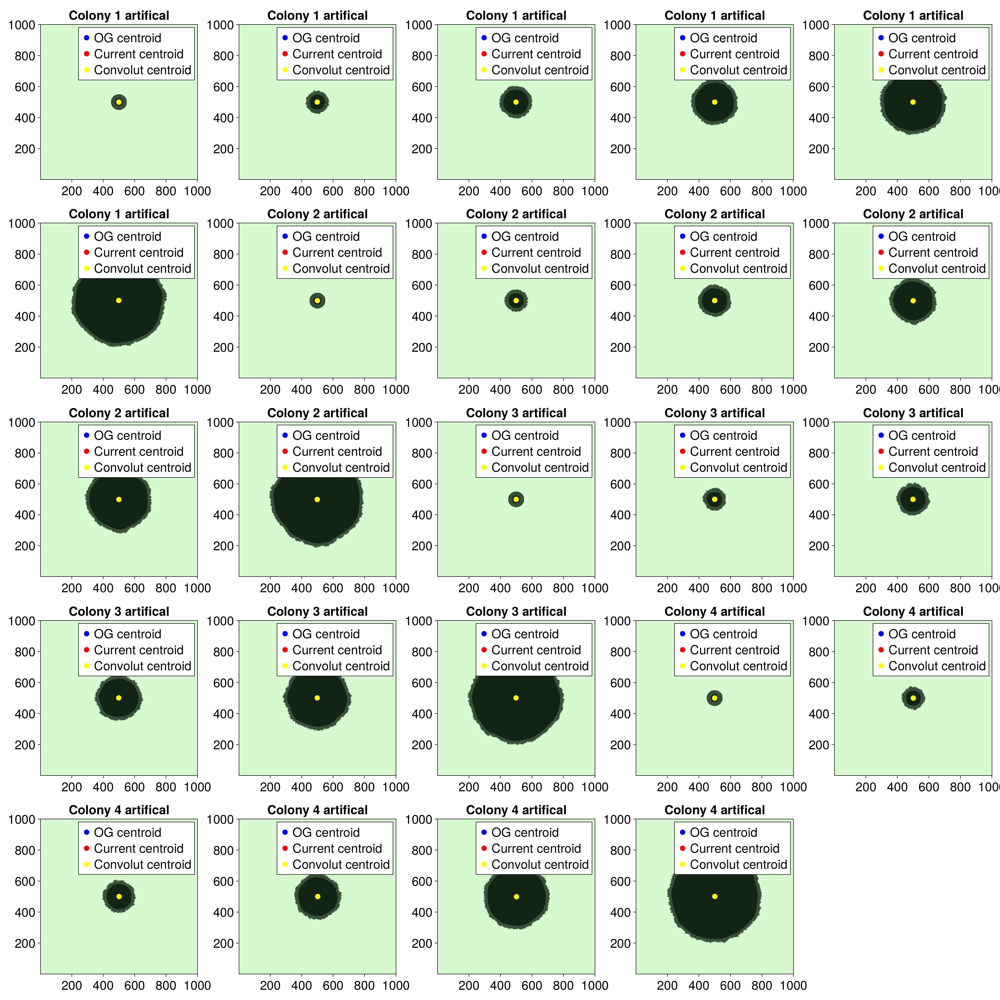

In [24]:
fontsize_theme = Theme(fontsize = 25)
update_theme!(fontsize_theme)
fig_big = plot_time_series_cov_centroid(img_int_vec_2, para)
fig_big

In [25]:
para = parameters(
    time_points = Float64[0,24,48,72,96,120],
    im_size = [1000,1000],
    plot_factor = 2
);
fontsize_theme = Theme(fontsize = 15)
update_theme!(fontsize_theme)

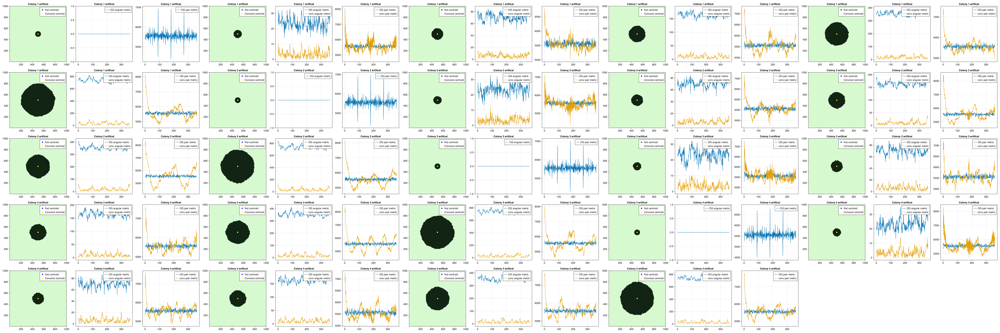

In [26]:
fig_metric = plot_time_series_metrics(img_int_vec_2, para)

### 4. Show angular metric schematic dividing the image into circular sectors

In [27]:
para = parameters(
    time_points = Float64[0,24,48],
    im_size = [1600,1600],
    plot_factor = 2
)

colony  =BitArray(zeros(Bool, para.im_size...,para.stacks))
build_artifical_colony!(para.Center,(@view colony[:,:,1]),para.radius_colony,para.Points)
pixel_to_add_vec = para.pixel_to_add(colony[:,:,1])
grey_rev = reverse(co.grayC10)


for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_radom_cov!(int_img,pixel_to_add_vec[j-1])
end


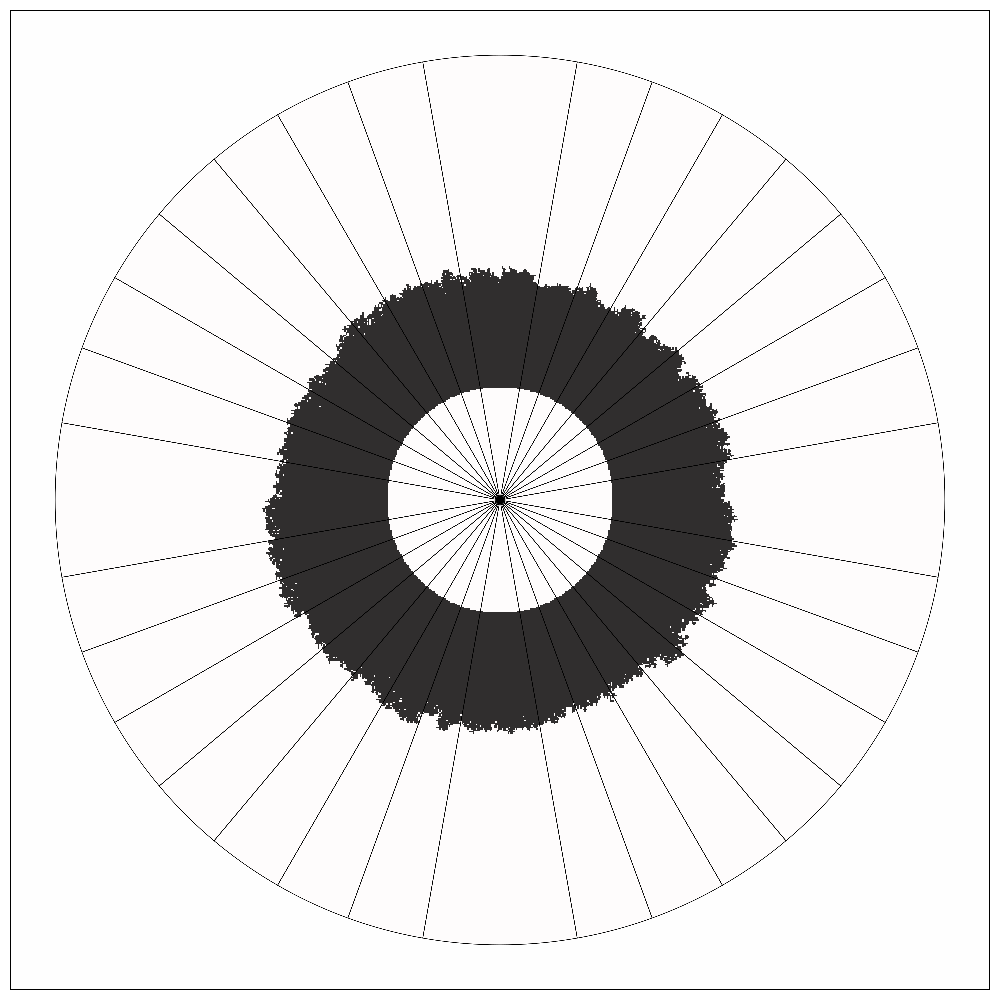

In [28]:
plot_metric_schematic(colony, para,grey_rev, name = "rand_expand")

In [29]:
grey_rev = reverse(co.grayC10)
for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_finger_radom_cov!(int_img,pixel_to_add[j-1], generate_dir_vec(para))
end

LoadError: UndefVarError: `pixel_to_add` not defined

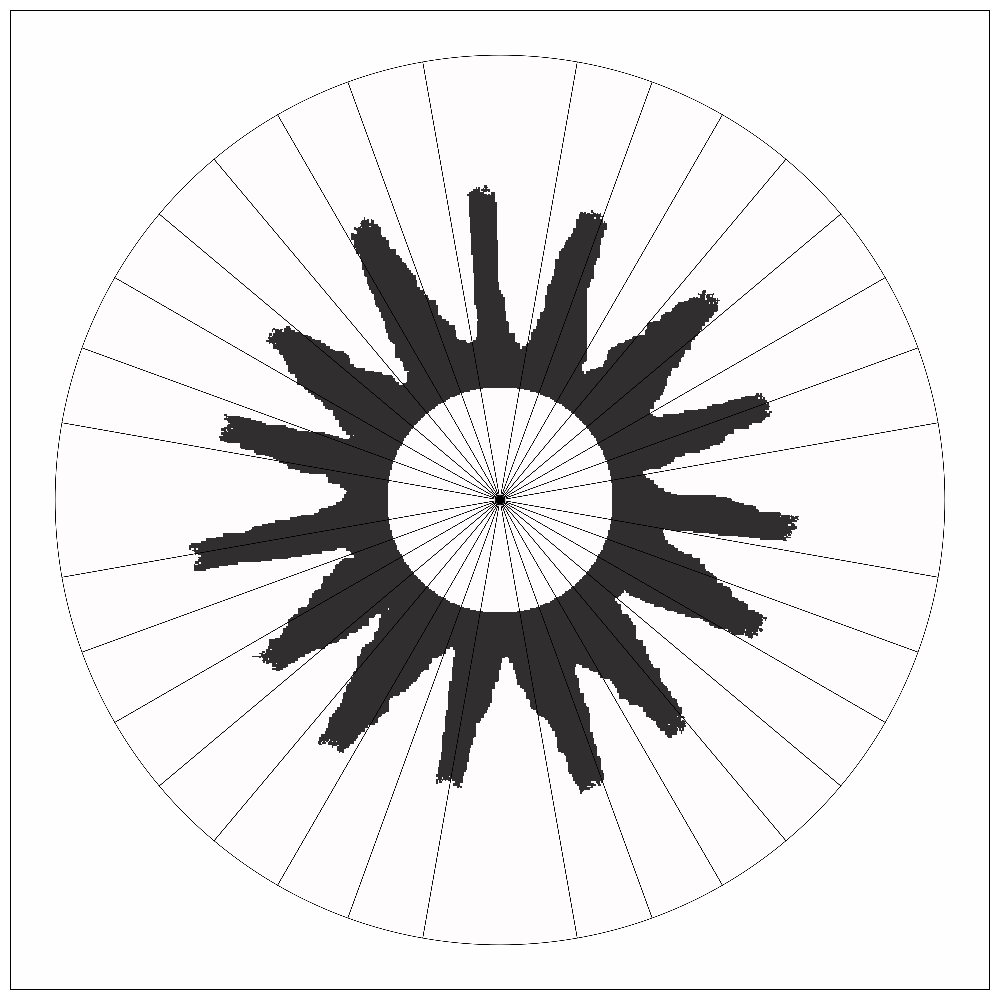

In [ ]:
plot_metric_schematic(colony, para,grey_rev, name = "finger_expand")

In [ ]:
grey_rev = reverse(co.grayC10)
for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_finger_radom_cov!(int_img,pixel_to_add[j-1], generate_dir_vec(para),still_spawn_rate = 0.0)
end

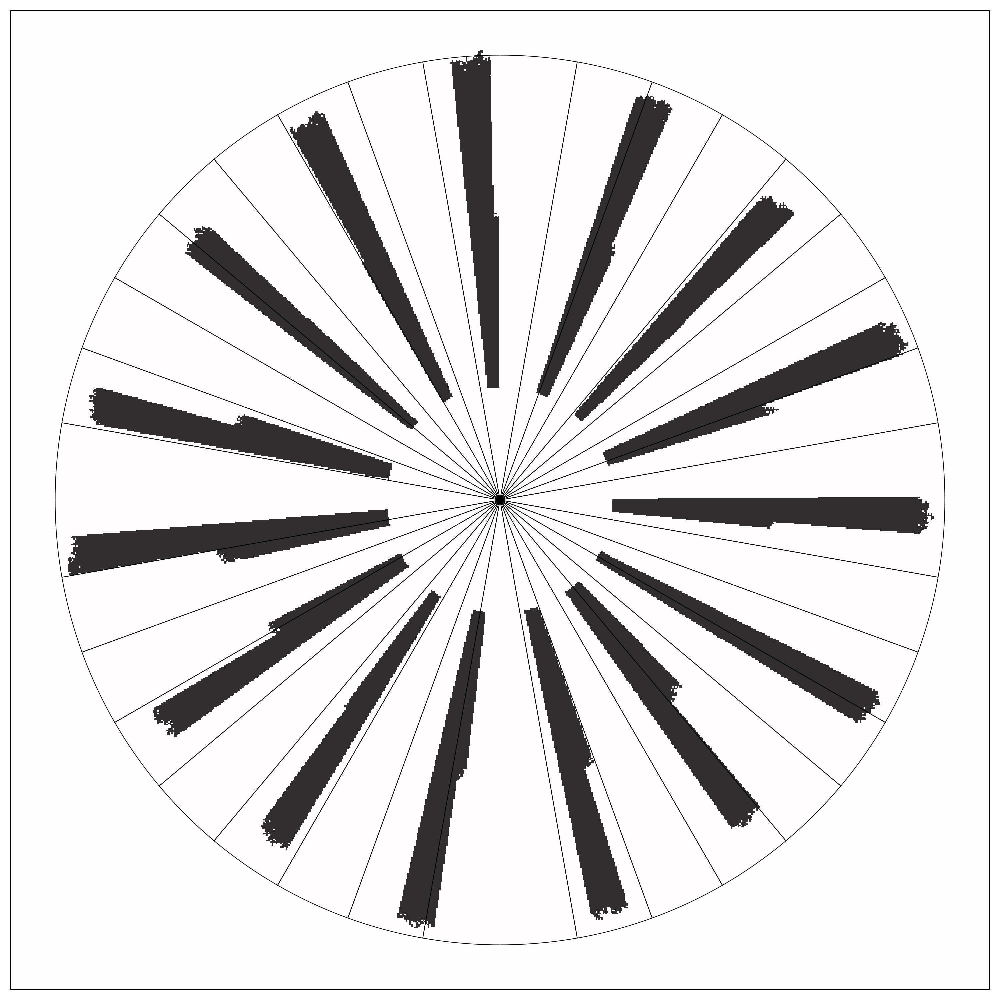

In [ ]:
plot_metric_schematic(colony, para,grey_rev, name = "finger_expand")

In [ ]:
?expand_colony_finger_radom_cov!

search: expand_colony_finger_radom_cov!



```
expand_colony_finger_radom_cov!(img::AbstractArray, pixels_to_add::Int, dir::Vector{Int}; dir_match_rate::AbstractFloat = 0.999, still_spawn_rate::AbstractFloat = 0.99, min_neigbour::Int = 2)
```

Expand the colony in the image `img` by adding `pixels_to_add` pixels. The expansion is done randomly  at the border of the colony, but it is more likely to expand in the direction specified by `dir`.  The border is determined by convolving the image with a Laplacian kernel and finding points where the convolution  is greater than 0.1. The function modifies the input image in-place.

# Arguments

  * `img::AbstractArray`: A 2D array representing the image of the colony. The colony is represented by 1s and the background by 0s.
  * `pixels_to_add::Int`: The number of pixels to add to the colony.
  * `dir::Vector{Int}`: A vector representing the preferred direction of expansion.
  * `dir_match_rate::AbstractFloat`: A float representing the threshold for the dot product between the preferred direction and the point. Default is 0.999.
  * `still_spawn_rate::AbstractFloat`: A float representing the probability of expanding in a direction opposite to `dir`. Default is 0.99.
  * `min_neigbour::Int`: The minimum number of neighboring points that must be occupied for a point to be added to the colony. Default is 2.

# Example

```julia
img = zeros(100, 100)
img[50:55, 50:55] .= 1
expand_colony_finger_radom_cov!(img, 100, [1, 0])
```
